# Data Classification

### Dataset and Imports

In [1]:
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt

# Sklearn
import sklearn

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, KFold

from sklearn.decomposition import PCA, KernelPCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [2]:
data_all = pd.read_pickle('training_dataset_task3/task_3_training_5bdf9a9ed30b9a66_749fa46_pandas.pkl')
data = data_all.loc[:,'pianist_id':'arousal']

X = data.drop('quadrant', axis=1)
y = data['quadrant']

# preprocess dataset
X = StandardScaler().fit_transform(X)

# cross validation
kf = KFold(n_splits=10)

**quadrant**: The quadrant in the valence/arousal space (i.e., the class label) of the snippet. The quadrants are mapped as 1="happy", 2="angry", 3="sad", 4="relaxed". This is the main target for the classification task!

**valence**: The aggregated value of the valence for the snippet. **This target is just provided as reference,** so that you can do more in-depth exploration of the behavior of your classifiers, if you choose to do so. You should not use this as a target or as an input to the classifiers!

**arousal**: The aggregated value of the arousal for the snippet. **This target is just provided as reference,** so that you can do more in-depth exploration of the behavior of your classifiers, if you choose to do so. You should not use this as a target or as an input to the classifiers!

more information: https://moodle.jku.at/jku/mod/page/view.php?id=6752583

In [3]:
# just a plot of two random features

fts = list(data.columns)
i = np.random.randint(len(fts))
j = np.random.randint(len(fts))

alt.Chart(data).mark_circle(size=60, opacity=1).encode(
    x=fts[i],
    y=fts[j],
    color='quadrant:N',
    tooltip=['segment_id', 'snippet_id', 'quadrant']
).properties(
    width=800,
    height=400
)

alt.Chart(...)

## KNN

KNN classifier has 1 hyperparameter: k
we can optimize for this parameter

In [4]:
def evaluate_kNN(X,y,kfold,n_neighbors): 
    knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors)
    loss = sklearn.metrics.make_scorer(sklearn.metrics.zero_one_loss)
    scores = sklearn.model_selection.cross_val_score(knn,X,y,cv=kfold,scoring=loss)
    return scores.mean()

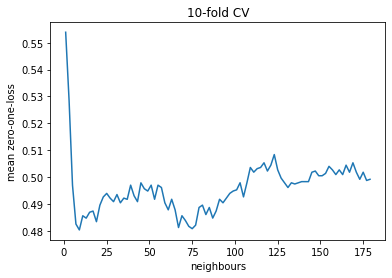

In [6]:
errors = [evaluate_kNN(X,y,10,i) for i in range(1,180,2)]

error_plot = plt.plot(range(1,180,2), errors)
plt.title('10-fold CV')
plt.xlabel('neighbours')
plt.ylabel('mean zero-one-loss')
plt.show()

In [7]:
minimum = errors.index(min(errors))

In [8]:
knn = KNeighborsClassifier(4)
performance = cross_val_score(estimator=knn, X=X, y=y, cv=kf).mean()

print(f'Therefore, the best we can do with the KNN classifier is at k={minimum},',
      f'which gives us a performance of {performance*100}%.')

Therefore, the best we can do with the KNN classifier is at k=4, which gives us a performance of 47.41668581935187%.


## SVM

### linear

In [9]:
svm_lin = SVC(kernel="linear", C=0.025)
print(cross_val_score(estimator=svm_lin, X=X, y=y, cv=kf).mean())

0.8733815981000536


### RBF

In [10]:
svm_rbf = SVC(gamma=2, C=1)
print(cross_val_score(estimator=svm_rbf, X=X, y=y, cv=kf).mean())

0.31957021374396694


## Decision Tree

In [11]:
dec_tree = DecisionTreeClassifier(max_depth=5)
print(cross_val_score(estimator=dec_tree, X=X, y=y, cv=kf).mean())

1.0


## Random Forest

In [12]:
rdm_for = RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
print(cross_val_score(estimator=rdm_for, X=X, y=y, cv=kf).mean())

0.4369397839577108


## Neural Network

In [13]:
nn = MLPClassifier(alpha=1, max_iter=1000)
print(cross_val_score(estimator=rdm_for, X=X, y=y, cv=kf).mean())

0.46640044434229677


## AdaBoost

In [14]:
ada = AdaBoostClassifier()
print(cross_val_score(estimator=ada, X=X, y=y, cv=kf))

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


## Naive Bayes

In [15]:
nb = GaussianNB()
print(cross_val_score(estimator=nb, X=X, y=y, cv=kf).mean())

0.5442905845399525


## QDA

In [16]:
qda = QuadraticDiscriminantAnalysis()
print(cross_val_score(estimator=qda, X=X, y=y, cv=kf).mean())

0.5223837432007967
